# パーセプトロン（Perceptron）

In [1]:
# packageのimport
from typing import Any, Union, Callable, Type, TypeVar
import numpy as np 
import numpy.typing as npt
import pandas as pd 
import matplotlib.pyplot as plt 
import plotly.express as px
import seaborn as sns
import matplotlib_fontja
import plotly.express as px 
import matplotlib.cm as cm
from matplotlib.animation import ArtistAnimation
from IPython.display import display, Markdown, HTML

plt.style.use("bmh")

## 動物の神経系との関係

人工ニューラルネットワーク（ANN; Artificial Neural Network）は，生物の学習メカニズムを模倣した機械学習の一手法として知られています．この人工ニューラルネットワークは単にニューラルネットワーク(NN; Neural Network)とも呼ばれていて，ニューラルネットワークは複数のニューロンと呼ばれる細胞のネットワークのことを指します．  
ANNは人間を初めとした動物の脳内に存在するニューラルネットワークをそのまま不足無く再現した数理モデルではありませんが，着想を得ていることは確かです．

以下に生物学的なニューロン（ニューラルネットワークを構成する細胞）の構造を示します．

> ![Neuron Diagram & Types | Ask A Biologist https://askabiologist.asu.edu/neuron-anatomy ](https://askabiologist.asu.edu/sites/default/files/resources/articles/neuron_anatomy.jpg)  
> 生物学的なニューロンの構造．出典： [Neuron Diagram & Types | Ask A Biologist](https://askabiologist.asu.edu/neuron-anatomy)

これをもう少し簡略化した図にすると... 

>![「ディープラーニングがわかる数学入門」P.11](https://starpentagon.net/analytics/wp-content/uploads/2017/09/neuron.png)  
> 生物学的なニューロンの信号伝搬の仕組み．出典: 「[ディープラーニングがわかる数学入門](https://www.amazon.co.jp/%E3%83%87%E3%82%A3%E3%83%BC%E3%83%97%E3%83%A9%E3%83%BC%E3%83%8B%E3%83%B3%E3%82%B0%E3%81%8C%E3%82%8F%E3%81%8B%E3%82%8B%E6%95%B0%E5%AD%A6%E5%85%A5%E9%96%80-%E6%B6%8C%E4%BA%95-%E8%89%AF%E5%B9%B8/dp/477418814X)」P.11 

生物学的なニューロンは刺激を受け取った際にある閾値を超えると発火し，接続された別のニューロンに信号を伝播する機能を持っています．脳内ではたくさんのニューロンが結合したネットワークが存在し，私たちが何かを考えたり外部刺激に対してアクションを起こせたりするのはこのニューロンのネットワークのおかげです．そうであると知ると，「これをコンピュータプログラムで再現できれば，人工知能を作れるんじゃないか？」と思えてきませんか？

最後に，生物学的なニューロンをシンプルな数理モデルで再現したのが以下に示す形式ニューロン{cite}`McCulloch1943-py`です．

> ![](https://cz-cdn.shoeisha.jp/static/images/article/13501/13501_02.jpg)  
形式ニューロンの一例．出典：[ディープラーニングと脳の関係とは？ 人工ニューロンや再帰型ニューラルネットワークを解説|CodeZine（コードジン）](https://codezine.jp/article/detail/13501)  
> また，この記事は『[あたらしい脳科学と人工知能の教科書](https://www.amazon.co.jp/dp/479816495X?tag=searticle1-22)』の「Chapter4　脳と人工知能」から一部を抜粋し編集されたもの．


形式ニューロンのことを人工ニューロンと呼んでいる場合もあるようです[要出典]．ここまで簡略化すると，コンピュータプログラムで実装できそうですね．この形式ニューロンを使って，例えば二値分類問題を解いてみましょう．

## 単純パーセプトロン

### 単純パーセプトロンの基礎

:::{margin}
「閾値」："しきいち"と読みます．別の分野では"いきち"と読ませる場合もあり，英語ではthresholdと書きます
:::

一つの形式ニューロンを使って2値分類などの問題を解くアルゴリズムを，単純パーセプトロンと呼びます．パーセプトロンが初めて提案された論文では，単純パーセプトロンを複数個並べて，さらにこれを多層化することでより難しい問題を解く所までが提案されています．{cite}`Rosenblatt1958-qg`   
改めて，単純パーセプトロンは上記で示した図のような数理モデルです．ニューロンは外部刺激を受けた際に，入力値がある閾値を超えた際に，次のニューロンに対して出力信号を返します．それでは単純パーセプトロンを使って，二値クラス分類を行う例を考えていきます．


:::{margin}
統計学の分野では特徴量を説明変数，クラス変数を目的変数とも呼びます．
:::


単純パーセプトロンの数理モデルを説明するには，実際にどのように使われるのかを見せながら行うのが簡単です．そのためまずはデータの準備を行います．個々の訓練データは$(\mathbf{x},y)$という形をしているとしましょう．
ここで$\mathbf{x}=[x_1,\cdots, x_d]$であり$\mathbf{x}$は$d$個の特徴量変数を含んだ行ベクトルです．
（通常列ベクトルで書く方が多いのかもしれませんが，[NumPy](https://numpy.org/){cite}`2020NumPy-Array` や [PyTorch](https://pytorch.org/){cite}`NEURIPS2019_9015` を初めとしたPythonのDeep Learning Frameworkとの親和性を考えてこのようにしています．）
$y \in \{-1,1\}$は2値のクラス変数の観測値です．


ここで単純パーセプトロンの模式図を再掲します．
> ![](https://cz-cdn.shoeisha.jp/static/images/article/13501/13501_02.jpg)  
人工ニューロンの一例．ただし，図は[ディープラーニングと脳の関係とは？ 人工ニューロンや再帰型ニューラルネットワークを解説|CodeZine（コードジン）](https://codezine.jp/article/detail/13501) より引用した．また，この記事は『[あたらしい脳科学と人工知能の教科書](https://www.amazon.co.jp/dp/479816495X?tag=searticle1-22)』の「Chapter4　脳と人工知能」から一部を抜粋し編集されたもの．

:::{margin}
$\hat{y}$はワイハット，またはワイカレットなどと読みます．
:::

この図における"入力"に相当するのが$\mathbf{x}$です．また，図のそれぞれの入力は，そのデータの特徴量に対応し，この入力の数は特徴量の数に設定します．それと同じ数だけある"重み"に相当するのは$\mathbf{w}=[w_1,\cdots, w_d]$です．これはそれぞれの入力の重要度を重み付けるために用いられるので， __結合重み__ や単に __重み__ と言われます．パーセプトロンでは入力と，これにそれぞれ対応した重みがあり，これらの重み付き和がニューロンに入ります．最終的に入力されることになる重み付き和が，ある一定の基準（閾値）よりも大きい場合には出力として1を，それ以下ならば-1を返すことにしましょう．この「入力値が閾値を超えたか」を判別し「任意の出力を返す」機能を持っている関数があるので，この関数に入力値を入れることで出力$\hat{y}\in \{-1,1\}$を得ます．



入力される加重和に対して，何かしらの操作して出力値を変える関数を活性化関数と呼びましょう．これはニューロンが活性化（発火）し，次のニューロンに信号を伝播する様子を再現します．

ここまでを式で表してみます．

$$
\hat{y} = \operatorname{sign}\{\mathbf{w}\cdot \mathbf{x}\}=\operatorname{sign}\{\sum_{j=1}^{d}w_j x_j\}
$$

ここで活性化関数として，[符号関数$\operatorname{sign}$](https://mathlandscape.com/sign-function/)（この他に$\operatorname{step}$関数とも呼ばれます．）を使います．$\operatorname{sign}$の定義は以下：

$$
\operatorname{sign}\{x\}=\operatorname{sgn}\{x\}= 
    \begin{cases}
    1 &  \text{if}~ x > 0  \\ 
    -1 &  \text{if}~ x \leq 0 
    \end{cases}
$$

ただし，ここで$x$は適当な入力値という意味であり，$\mathbf{x}$とは関係が無いことに注意してください．また，条件分岐の等号はどちらのcaseについているのかについても然程重要ではありません．

:::{hint}  
sign関数は以下のような定義の場合もあります．


$$
\operatorname{sign}\{x\}=\operatorname{sgn}\{x\}= 
    \begin{cases}
    1 &  \text{if}~ x > 0  \\ 
    0 &  \text{if}~ x \leq 0 
    \end{cases}
$$

本稿で採用しているパターン（1 or -1を返す）だと，単純パーセプトロンをプログラムとして実装する際に条件分岐を減らせる点において優れています．今回はプログラムが簡単になるためこちらを採用します．これに対して，ここで紹介しているパターン（1 or 0を返す）だと，真偽値と対応させやすい（特にNumPyだと1はTrue, 0はFalseとして計算することができます）という利点があります．

:::

:::{margin}

sign関数は入力値が0以下の場合と正の数になった場合とで値が変わります．そのため連続な関数では無いことに注意してください．

:::

In [2]:
def sign(x):
    # 単にreturn float(x>0)としてもOKです．
    if x > 0:
        return 1.
    return -1.

def sign(x:np.ndarray):
    y = (x > 0).astype(x.dtype)
    y[y==0] = -1
    return y 


x = np.linspace(-10,10,200)
"""
fig = px.scatter(x=x, y=sign(x), title="sign関数", height=500,width=500)
fig.update_xaxes(title=dict(text='入力 x'))
fig.update_yaxes(title=dict(text='出力 sign(x)'))
"""

'\nfig = px.scatter(x=x, y=sign(x), title="sign関数", height=500,width=500)\nfig.update_xaxes(title=dict(text=\'入力 x\'))\nfig.update_yaxes(title=dict(text=\'出力 sign(x)\'))\n'

### biasの導入

このsign関数の閾値は常に$0$に設定されていますが，場合によっては値を変更したくなるかもしれません．そのような場合に有効なのがbias $b\in \mathbb{R}$です．これを活性化関数の入力値に対して加算することで，閾値の操作が可能です．

$$
\hat{y} = \operatorname{sign}\{\mathbf{w}\cdot \mathbf{x} + b\}=\operatorname{sign}\{\sum_{j=1}^{d}(w_j x_j)+ b\}
$$

この式を使うと，パーセプトロンの条件分岐は以下のようになります．

$$
\operatorname{perceptron}\{\mathbf{x};\mathbf{w},b\}= 
    \begin{cases}
    1 &  \text{if}~ \mathbf{w}\cdot \mathbf{x} + b > 0  \\
    -1 &  \text{if}~ \mathbf{w}\cdot \mathbf{x} + b \leq 0 
    \end{cases} 
$$
$b$を移項するとより分かりやすいかも知れません．

$$
\operatorname{perceptron}\{\mathbf{x};\mathbf{w},b\}=
    \begin{cases}
    1 &  \text{if}~ \mathbf{w}\cdot \mathbf{x}  > -b  \\ 
    -1 &  \text{if}~ \mathbf{w}\cdot \mathbf{x} \leq -b 
    \end{cases}
$$

## 実装

Pythonを使った単純パーセプトロンの実装は以下のようになります．

### 行列計算を用いない実装

パーセプトロンの図を思い出してください．入力される特徴量変数$x_i (i = 1,2,...d)$ の一つ一つに対して，対応する$w_i$が乗算されます．その後これらを合計し，$b$を加算することでニューロンへの入力値が求められました．その後は閾値を超えているかをチェックし，-1 or 1を返す処理を行います．それをpure pythonで実装した例が以下です．

In [3]:
def sign(x:float)->float:
    if x > 0:
        return 1.
    return -1

def perceptron(X:list[float], W:list[float],b:float)->float:
    h = 0.
    for _x, _w in zip(X,W):
        h += _x * _w
    h += b
    return sign(h)

W = np.random.random([3])
b = 0.2
X = np.random.random([3])
perceptron(X, W,b)

1.0

### 行列計算を用いた実装

重み付き総和の計算は，$\mathbf{x}$と$\mathbf{w}$のdot積で求まります．後は$b$を加算し，sign関数を適用するだけでOKです．  
ただし，以下のコードの
```py
np.dot(w,x)
```
において，`w`と`x`はベクトルや一次元配列が期待されていることに注意してください．これらオブジェクトがnp.ndarrayである場合，shapeは(3)であり，(1,3)や(3,1)ではありません．この違いを理解しておかないと，このコード（特にnp.dot関数）は正しく動作しないでしょう．

In [4]:
def perceptron(X:npt.ArrayLike, W:npt.ArrayLike, b:float)->float:
    h = np.dot(W,X) + b
    return sign(h)


W = np.random.random([3])
b = 0.2
X = np.random.random([3])
perceptron(X, W,b)

1.0

## 実験

### ORゲート

単純パーセプトロンの能力を紹介するために，実装したperceptron関数を利用して論理回路を再現してみます．

In [5]:
truth_table = pd.DataFrame(
    np.array([[1,1,0,0],[1,0,1,0]]).T,
    columns=["x1","x2"]
)
truth_table["or"] = truth_table.x1 | truth_table.x2
truth_table["and"] = truth_table.x1 & truth_table.x2
truth_table["xor"] = np.logical_xor(truth_table.x1,truth_table.x2).astype(truth_table.x1.dtype)

truth_table[truth_table == 0] = -1
print("真偽値表")
truth_table

真偽値表


,x1,x2,or,and,xor
0,1,1,1,1,-1
1,1,-1,1,-1,1
2,-1,1,1,-1,1
3,-1,-1,-1,-1,-1


ここで，真偽値表のx1列，x2列がパーセプトロンに入力される特徴量です．一行ずつ取り出して，or，andの値をそれぞれ予測してみましょう．

まずはorを再現してみます．

In [6]:
X = truth_table[["x1","x2"]].to_numpy()
Y = truth_table["or"].to_numpy()
Y_hat = []

W = np.array([0.2, 0.2]) # 適当な2値で埋めた重みベクトル
b = 0.3 # 適当なスカラ値

for x in X:
    y_hat = perceptron(x,W,b)
    Y_hat.append(y_hat)

print("or回路")
print("正答:",Y.tolist())
print("予測:",Y_hat)

or回路
正答: [1, 1, 1, -1]
予測: [1.0, 1.0, 1.0, -1]


or回路をパーセプトロンがどのように再現したのかをグラフで確認してみましょう．パーセプトロンの獲得した識別境界の式を用意します．

$$
\hat{y} =\operatorname{sign}\{\sum_{j=1}^{2}(w_j x_j)+ b\} = \operatorname{sign}\{w_1x_1+w_2x_2+b\}
$$

この式のsign関数の引数に着目し，$x_2$に対しての式に直します．

$$
x_2 = \frac{w_1x_1+b}{-w_2}
$$

これを使って識別境界（閾値）を散布図上にプロットします．（$x_1=0$時の$x_2$と，$x_2=0$時の$x_1$を求めて，2点を繋ぐ直線を引くことでも識別境界をプロットできますね．）


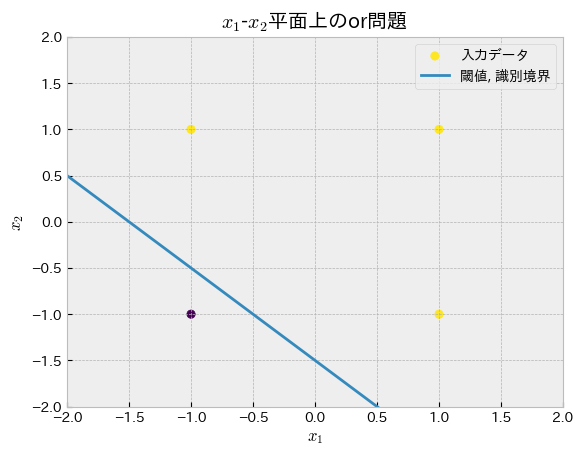

In [7]:
def plot_perceptron(w,b, truth_table, gate_type="or", need_output=False):
    linear = lambda x1,w,b: -(w[0]*x1 + b)/w[1]
    x1_sample = np.linspace(-2,2,100)

    fig, ax = plt.subplots()
    ax.scatter(truth_table.x1, truth_table.x2, c=truth_table[gate_type], label="入力データ")
    ax.plot(x1_sample, linear(x1_sample, W,b), label="閾値, 識別境界")
    ax.set_title(f"$x_1$-$x_2$平面上の{gate_type}問題")
    ax.set_xlabel("$x_1$")
    ax.set_ylabel("$x_2$")
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    plt.legend()
    #ax.set_aspect('equal')
    if need_output:
        return fig
plot_perceptron(W,b,truth_table,gate_type="or")

境界線の式やプロットから分かる通り，境界線は一本の直線になっています．パーセプトロンを使ったクラス分類はこのような線形分離可能な問題にのみ有効であることがわかります．

### ANDゲート

次はandを再現します．  
以下のセルで，W,bの値を適当に変化させて期待通りの答えを見つけてみてください．

and回路
正答: [1, -1, -1, -1]
予測: [1.0, -1, 1.0, 1.0]


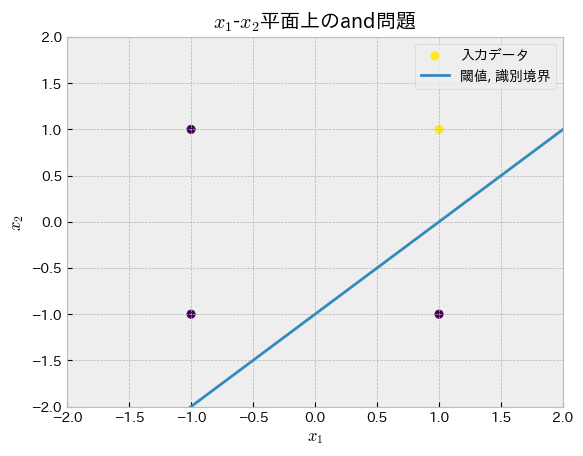

In [8]:
X = truth_table[["x1","x2"]].to_numpy()
Y = truth_table["and"].to_numpy()
Y_hat = []

W = np.array([-1,1]) # 適当な2値で埋めた重みベクトル
b = 1.0 # 適当なスカラ値

for x in X:
    y_hat = perceptron(x,W,b)
    Y_hat.append(y_hat)

print("and回路")
print("正答:",Y.tolist())
print("予測:",Y_hat)

plot_perceptron(W,b,truth_table,gate_type="and")

## パーセプトロンの再考

パーセプトロンには「線形に分離できる場合のみ正しい答えを見つけることができる」という限界があるようですが，それでもその制限の中ならば，$\mathbf{w}$と$b$をうまく設定してあげることで自動でクラス分類ができそうです．ここでの$\mathbf{w}$と$b$のような変数を __パラメータ(parameters)__ と呼びます．また，これらは後述するように様々なアルゴリズムによりデータとクラスのペアがたくさんあれば自動獲得させることが可能です．そのため __学習可能パラメータ__ と敢えて呼ぶこともあります．


### パラメータ更新アルゴリズム


それではパーセプトロンの学習可能パラメータの「いい感じの値」を見つけるアルゴリズムを考えていきましょう．パーセプトロンに対する学習即には，大きくヘブ則とパーセプトロン学習即の二つが知られています．そのうちヘブ則は収束しないことが多いので，疑似コードを使ってパーセプトロンの学習則を見ていきましょう．

:::{prf:algorithm} Perceptron learning rule
:label: perceptron

**Input:** $r > 0$: 学習率 , $\mathcal{D}=\{(\mathbf{x}^{(i)},y^{(i)})\}_{i=1}^{N}$: データセット

**Output:** $\mathbf{w}$: 結合重み, $b$: バイアス

1. 加重$\mathbf{w}$，バイアス$b$をランダムに初期化する  
2. While 正しい出力をしない事例がある:  
3. &nbsp;&nbsp;&nbsp;&nbsp;For each それぞれの事例 $(\mathbf{x},y) \in \mathcal{D}$:  
4. &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 現在の出力 $\hat{y} = \operatorname{perceptron}_{}(\mathbf{x};\mathbf{w},b)$ を計算  
5. &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $\mathbf{w} \leftarrow \mathbf{w} + r(y-\hat{y})\mathbf{x}$  
6. &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $b \leftarrow b + r(y-\hat{y})$  

:::

:::{margin}
パーセプトロンだと学習の終了まで短時間で終わるのでWHILEの終了条件を気にしなくても良いですが，他の（訓練終了までに時間のかかる）機械学習手法の場合は，最大epoch数（or 最大更新回数）を設定しておくことが多いです．
:::

疑似コードに慣れていない人のために，一行ずつ解説をつけておきます．

- Input（入力）
    - 所与の値として学習率（Learning rate）$r$を指定します．ただし，0より大きい値でしてしましょう．パーセプトロンの場合は1でもOKです．
    - 学習させたいデータセット $\mathcal{D}=\{(\mathbf{x}^{(i)},y^{(i)})\}_{i=1}^{N}$ を渡します．
- Output（出力）
    - このアルゴリズムではパラメータ$\mathbf{w},b$を返します．
1. この値について適切な値がわからないので乱数で初期化することにしましょう．まずは適当に標準正規分布に従うものとします．
2. perceptronが全てのデータに対して正しい答えを返すまで以下を繰り返します．
3. データセット$\mathcal{D}$から一つ一つ事例$(\mathbf{x},y)$を取り出し，以下を繰り返します．
4. 現状のパラメータの値を使って，パーセプトロンの出力を計算します．
5. wを更新します．
    - $r(y-\hat{y})x$で更新幅を決定しています．
        - 正しい答えならば0となり$\mathbf{w}$の更新はなしです．
        - 正答が正で予測値が負の場合は，更新幅は$2r\mathbf{x}$となり，逆の場合は$-2r\mathbf{x}$となります．
6. bを更新します．
    - 入力値が常に$1$であると考えれば，$\mathbf{w}$の更新式と同じです．

:::{margin}
パーセプトロンの学習則として紹介したアルゴリズムは，簡単な勾配降下法の例として見ることもできます．
:::

### プログラムの実装

このアルゴリズムに従ってプログラムを実装し，実際にパラメータが収束するのかを確認してみてください．

正解: [ 1  1  1 -1]
予測: [1.0, 1.0, 1.0, -1]


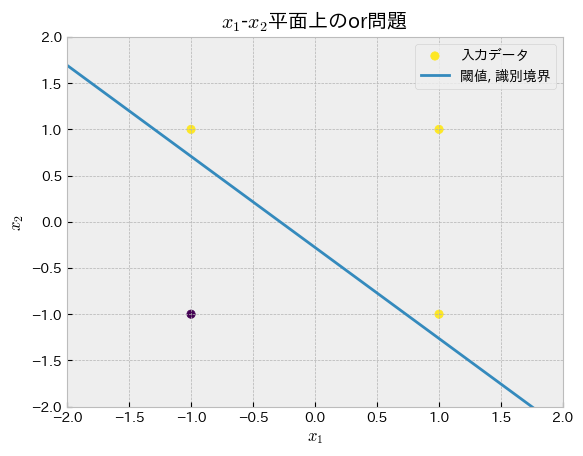

In [9]:
def update_perceptron(X,Y, lr=1.0, rng = np.random.default_rng(10)):
    W = rng.normal(0,1, [X.shape[-1]])
    # b = float(rng.normal(0,1, 1))
    # Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
    b = rng.normal(0,1, 1) 
    diff = np.inf
    while diff>0:
        diff = 0
        for (x,y) in zip(X,Y):
            y_hat = perceptron(x, W, b)
            W += lr*(y-y_hat)*x
            b += lr*(y-y_hat)
            diff += y != y_hat
    return W, b

gate_type = "or"
W,b = update_perceptron(
    truth_table[["x1","x2"]].to_numpy(),
    truth_table[gate_type].to_numpy(),
    rng=np.random.default_rng(np.random.randint(0,2**10))
    )
plot_perceptron(W,b,truth_table=truth_table, gate_type=gate_type)

Y_hat = []
for x in truth_table[["x1","x2"]].to_numpy():
    y_hat = perceptron(x, W,b)
    Y_hat.append(y_hat)
print("正解:",truth_table[gate_type].to_numpy(),)
print("予測:",Y_hat)

"or"，"and"が正しく分離できていればプログラムはOKです．

#### 学習過程の可視化

上記のパーセプトロン学習則関数がどのように識別境界を獲得するのかを確認してください．学習中の各ステップにおいて作成された識別境界（$W_1,W_2,b$によって作られる直線）をいちいちグラフにすることで学習過程を追跡します．

ここではステップが進むほど色が濃くなる（黒くなる）ようにしています．徐々に学習が進み，直線がTrueとFalseの間に収まるように動いていることが見て取れるでしょうか？

In [12]:
class PlotPerceptronTraining:
    def __init__(self, max_iters=100):
        self.W = []
        self.b = []
        self.theta = []
        self.max_iters = max_iters

    def update_perceptron(self, X,Y, lr=1.0, rng = np.random.default_rng(10)):
        W = rng.normal(0,1, [X.shape[-1]])
        # b = float(rng.normal(0,1, 1))
        # Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
        b = rng.normal(0,1, 1)[0]

        self.W.append(W)
        self.b.append(b)
        i=0
        diff = np.inf
        while diff>0:
            diff = 0
            for (x,y) in zip(X,Y):
                y_hat = perceptron(x, W, b)
                W += lr*(y-y_hat)*x
                b += lr*(y-y_hat)
                diff += y != y_hat
                # save params
                self.W.append(W)
                self.b.append(b)

                if W[1] != 0:
                    line = np.array([-W[0] / W[1], -b / W[1]])
                else:
                    line = np.array((-np.inf, -np.inf))
                self.theta.append(line)
                i+=1
                if self.max_iters <= i:
                    print("break...")
                    return W,b
        return W, b
        

def visualize_perceptron_training(LEARNING_RATE:int=1,
                                  EXP_SEED:int=0,
                                  GATE_TYPE:str="or",
                                  truth_table:pd.DataFrame=truth_table, 
                                  use_static_images:bool=True,
                                  save_path:str|None=None)->None: 
    p = PlotPerceptronTraining()
    W,b = p.update_perceptron(
        truth_table[["x1","x2"]].to_numpy(),
        truth_table[GATE_TYPE].to_numpy(),
        rng=np.random.default_rng(EXP_SEED),
        lr=LEARNING_RATE,
        )
    # 散布図のデータを用意
    x1, x2 = truth_table.x1.to_numpy(), truth_table.x2.to_numpy()

    def prepare_ax_(ax):
        #fig, ax = figsubplots(1, 1, figsize=(8,5))
        ax.set_xlim(-10, 10)
        ax.set_ylim(-10, 10)
        ax.scatter(x1, x2, marker='o', c=truth_table[GATE_TYPE])
        # x軸y軸
        ax.axhline(y=0,linewidth=0.5)
        ax.axvline(x=0,linewidth=0.5)
        # 右の図の範囲
        ax.hlines(y=[-1,1],linewidth=0.5, xmin=-1.1,xmax=1.1)
        ax.vlines(x=[-1,1],linewidth=0.5, ymin=-1.1,ymax=1.1)
        # 軸のラベルの設定
        ax.set_xlabel("$x^{0}$")
        ax.set_ylabel("$x^{1}$")
        ax.set_title("俯瞰図")
    
    def prepare_ax2_(ax):
        ax.set_xlim(-1.1, 1.1)
        ax.set_ylim(-1.1, 1.1)
        ax.scatter(x1, x2, marker='o', c=truth_table[GATE_TYPE])
        # x軸y軸
        ax.axhline(y=0,linewidth=0.5)
        ax.axvline(x=0,linewidth=0.5)
        # 軸のラベルの設定
        ax.set_xlabel("$x^{0}$")
        ax.set_ylabel("$x^{1}$",)
        ax.set_title("データ点の周辺")
    
    # 識別境界の一次関数に代入するxの用意
    x_lin = np.linspace(-10, 10, 100)
    N = len(p.theta) 
    # 図の用意
    fig = plt.figure(figsize=(11,5))
    fig.suptitle(f"Perceptronの{GATE_TYPE}問題学習の様子")
    ax = fig.add_subplot(1,2,1)
    prepare_ax_(ax)
    ax2 = fig.add_subplot(1,2,2)
    prepare_ax2_(ax2)
    fig2 = plt.figure(figsize=(11,5))
    fig2.suptitle(f"Perceptronの{GATE_TYPE}問題学習の様子（アニメーション）")
    ax3 = fig2.add_subplot(1,2,1)
    prepare_ax_(ax3)
    ax4 = fig2.add_subplot(1,2,2)
    prepare_ax2_(ax4)
    animation_frames = []
    
    for i, line in enumerate(p.theta):
        Θo, Θ1  = line
        if Θo == -np.inf:
            continue
        if (i+1) == N:
            # 最後のステップなら黒い線を引く
            c, ls, lw = 'k', '-', 2
            ax.plot(x_lin, Θo * x_lin + Θ1, c=c, ls=ls, lw=lw, label=f"step {i}")
            ax2.plot(x_lin, Θo * x_lin + Θ1, c=c, ls=ls, lw=lw, label=f"step {i}")
            animation_frames.append(
                ax3.plot(x_lin, Θo * x_lin + Θ1, c=c, ls=ls, lw=lw)+
                ax4.plot(x_lin, Θo * x_lin + Θ1, c=c, ls=ls, lw=lw)
                )
        else:
            # 途中のステップなら点線を引く．色はステップ数に従い徐々に濃くする．
            t = (i+1)/N
            ls, lw = "--", t * 2
            ax.plot(x_lin, Θo * x_lin + Θ1, color=cm.Greys(t), ls=ls, lw=lw, label=f"step {i}")
            ax2.plot(x_lin, Θo * x_lin + Θ1, color=cm.Greys(t), ls=ls, lw=lw, label=f"step {i}")
            animation_frames.append(
                ax3.plot(x_lin, Θo * x_lin + Θ1, color="k", ls=ls, lw=lw)+
                ax4.plot(x_lin, Θo * x_lin + Θ1, color="k", ls=ls, lw=lw)
            )
    plt.close(fig2)
    if not use_static_images:
        plt.close(fig)
    animation = ArtistAnimation(fig2, animation_frames, interval=150)
    if save_path is not None:
        animation.save(save_path, writer='Pillow')
    #display(Markdown("![](./animation.gif)"))
    display(HTML(animation.to_jshtml()))
    

MovieWriter Pillow unavailable; using Pillow instead.


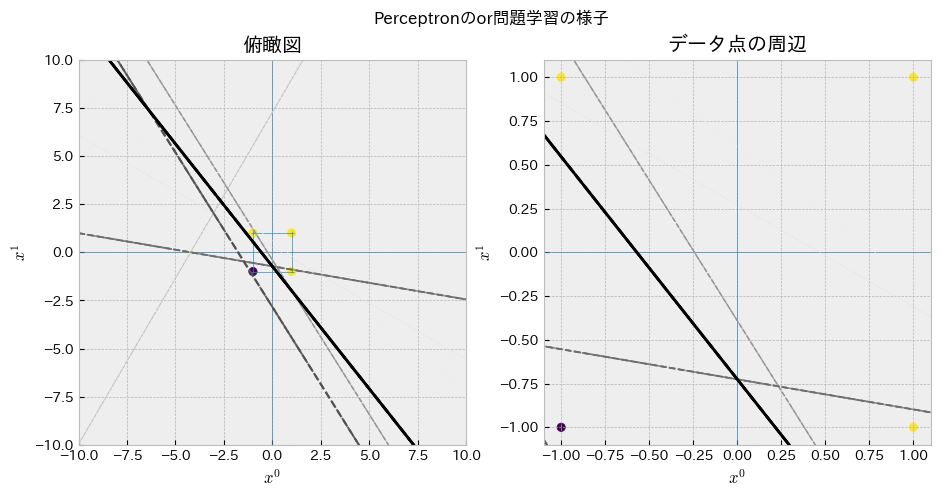

In [14]:
visualize_perceptron_training(
    LEARNING_RATE= 0.2, # 0.5, 1, ...
    EXP_SEED = 1007,    # np.random.randint(0,2**10)
    GATE_TYPE = "or",    # "and"
    save_path="animation.gif"
    )

## パーセプトロンの限界

### 「XOR問題」が解けないパーセプトロン

「パーセプトロンは線形分離可能な問題にのみ適用可能である」という話を上述しました．論理回路でもxor問題は線形分離不可能であると知られています．{cite}`Minsky2017-ab`

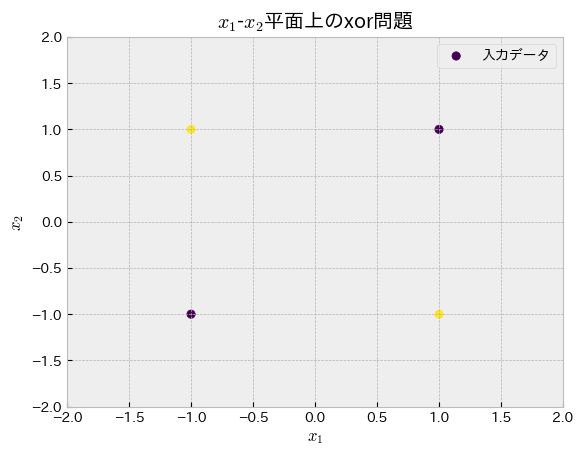

In [13]:
fig, ax = plt.subplots()
ax.scatter(truth_table.x1, truth_table.x2, c=truth_table["xor"], label="入力データ")
ax.set_title(f"$x_1$-$x_2$平面上のxor問題")
ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)
plt.legend()
plt.show()

XOR問題を二次元の散布図にしてみました．紫色と黄色の点を分離できるような直線を引くことは無理であることが分かります．  
また，実際にPerceptronを学習させてみると以下のようにいつまで経っても答えを見つけられないことがわかります．

In [14]:
visualize_perceptron_training(
    LEARNING_RATE= 0.2, # 0.5, 1, ...
    EXP_SEED = 1007,    # np.random.randint(0,2**10)
    GATE_TYPE = "xor",    # "and"
    use_static_images=False
    )

break...


パーセプトロンはこのような線形分離できない問題に対して，正しい答えを得ることができませんでした．そのためこれを解決できるようになるMLPが登場するまで，AI研究は __冬の時代__ と言われることになります．

### この問題を解決するためのヒント

> ![](https://ochiman6.com/wp-content/uploads/2019/12/XOR%E3%82%B2%E3%83%BC%E3%83%88%E3%81%AE%E5%9B%9E%E8%B7%AF.png)  
XOR回路  
出典：[【Python】パーセプトロンアルゴリズムを用いて論理回路を実装する](https://ochiman6.com/%E3%80%90python%E3%80%91%E3%83%91%E3%83%BC%E3%82%BB%E3%83%97%E3%83%88%E3%83%AD%E3%83%B3%E3%82%A2%E3%83%AB%E3%82%B4%E3%83%AA%E3%82%BA%E3%83%A0%E3%82%92%E7%94%A8%E3%81%84%E3%81%A6%E8%AB%96%E7%90%86)


作成できるゲートを組み合わせることによって，XORを実装することが可能です．

パーセプトロンを一つだけではなく，XORの図に合わせて複数組み合わせることで問題を解決できます．信号の伝搬を矢印として図示すると，以下のようなネットワーク構造になっていることがわかります．

![](./figs/mlp.png)
図：多層パーセプトロン

これを実装すると以下のようになります．

In [15]:
# np.ndarrayをそのまま使えるように関数を少し修正
def sign_np(x:np.ndarray)->np.ndarray:
    y = (x > 0).astype(x.dtype)
    y[y==0] = -1
    return y 

def perceptron_np(X:np.ndarray, W:np.ndarray,b:float)->np.ndarray:
    h = 0.
    for _x, _w in zip(X,W):
        h += _x * _w
    h += b
    return sign_np(h)

# 訓練
params_or = update_perceptron(
    truth_table[["x1","x2"]].to_numpy(),
    truth_table["or"].to_numpy(),
    rng=np.random.default_rng(np.random.randint(0,2**10))
    )

params_nand = update_perceptron(
    truth_table[["x1","x2"]].to_numpy(),
    truth_table["and"].to_numpy() * -1,
    rng=np.random.default_rng(np.random.randint(0,2**10))
    )

params_and = update_perceptron(
    truth_table[["x1","x2"]].to_numpy(),
    truth_table["and"].to_numpy(),
    rng=np.random.default_rng(np.random.randint(0,2**10))
    )

# 実行
output_or = perceptron_np(
    truth_table[["x1","x2"]].to_numpy().T,
    *params_or,
)

output_nand = perceptron_np(
    truth_table[["x1","x2"]].to_numpy().T,
    *params_nand,
)

output_and = perceptron_np(
    np.vstack([output_or, output_nand]),
    *params_and,
).astype(np.int64)

# 結果
print("正解:", truth_table["xor"].to_numpy())
print("予測:", output_and)

正解: [-1  1  1 -1]
予測: [-1  1  1 -1]


このようなニューロンのネットワークを __多層パーセプトロン（Multi-layer Perceptron, MLP）__ と呼びます．MLPでは，入力値を便宜上一層目として， __入力層（input layer）__ と呼びます．次のニューロンの層を中間層，または __隠れ層（hidden layer）__ と呼びます．そしてネットワーク全体の出力を出す最後の層を __出力層（output layer）__ と呼びます．

MLPを用いることで，パーセプトロン単体では解くことができなかった問題でも解けるようになりました．ただし，ネットワーク全体を一度にパラメータ更新させるような方法が存在しません．そのため，XOR問題のような，問題を切り分けることが簡単なタスクに対してのみこのアプローチ（個別に訓練したパーセプトロンを組み合わせるアプローチ）は有効です．

MLPの表現力を活かしたまま，ネットワーク全体のパラメータを一気通貫に訓練する方法については，次のノートで紹介します．

## 参考文献


### Web
1. [Neuron Diagram & Types | Ask A Biologist](https://askabiologist.asu.edu/neuron-anatomy)
1. [ディープラーニングがわかる数学入門](https://www.amazon.co.jp/%E3%83%87%E3%82%A3%E3%83%BC%E3%83%97%E3%83%A9%E3%83%BC%E3%83%8B%E3%83%B3%E3%82%B0%E3%81%8C%E3%82%8F%E3%81%8B%E3%82%8B%E6%95%B0%E5%AD%A6%E5%85%A5%E9%96%80-%E6%B6%8C%E4%BA%95-%E8%89%AF%E5%B9%B8/dp/477418814X)
1. [ディープラーニングと脳の関係とは？ 人工ニューロンや再帰型ニューラルネットワークを解説|CodeZine（コードジン）](https://codezine.jp/article/detail/13501) 
1. [マッチ箱の脳(AI) -- パーセプトロン - danglingfarpointer's memoization](https://danglingfarpointer.hatenablog.com/entry/2014/09/07/012011 )
1. [情報意味論的 パーセプトロンと多層パーセプトロン](http://www.sakurai.comp.ae.keio.ac.jp/classes/infosem-class/2010/05MLP.pdf)
1. [初心者の初心者による初心者のための単純パーセプトロン - Qiita](https://qiita.com/sakigakeman/items/625a9a4bee40ee0c13ef )
1. [【Python】パーセプトロンアルゴリズムを用いて論理回路を実装する](https://ochiman6.com/%E3%80%90python%E3%80%91%E3%83%91%E3%83%BC%E3%82%BB%E3%83%97%E3%83%88%E3%83%AD%E3%83%B3%E3%82%A2%E3%83%AB%E3%82%B4%E3%83%AA%E3%82%BA%E3%83%A0%E3%82%92%E7%94%A8%E3%81%84%E3%81%A6%E8%AB%96%E7%90%86)

### 論文等

```{bibliography}
:filter: docname in docnames
```